In [49]:
using Pkg

In [50]:
Pkg.activate(dirname(pwd()))

  Activating environment at `~/Documents/GitHub/ComputationalHeatTransfer.jl/Project.toml`


In [51]:
using ComputationalHeatTransfer
using LaTeXStrings
using Revise
using LinearAlgebra
using DifferentialEquations
using CoolProp
using Interpolations
using JLD2
using Plots
gr()  

cd(dirname(pwd()))
cd("src") 
# includet("ComputationalHeatTransfer.jl")
# using ..ComputationalHeatTransfer
includet("OneDOHP.jl")
using ..OneDOHP

## Get fluid properties

In [52]:
fluid_type = "butane"
Tᵥ = 291.2

291.2

In [53]:
using UnPack

p_fluid = get_saturation_property(fluid_type,Tᵥ)
@unpack Cpₗ,ρₗ,μₗ,hₗ,kₗ,Prₗ,Cpᵥ,ρᵥ,μᵥ,hᵥ,kᵥ,Prᵥ,σ,P,R,M,Rkg,αₗ,νₗ,νᵥ,hₗᵥ = p_fluid;

## Read data

In [54]:
using JLD2

In [55]:
# OHPdata = load("OHP1_40W.jld2")
# OHPdata = load("OHP1_40W_bothPe7.jld2")
# OHPdata = load("OHP1_40W_bothfine.jld2")
# OHPdata = load("OHP2_40W_E075.jld2")
# OHPdata = load("OHP2_40W_E070.jld2")
# OHPdata = load("OHP2_40W_E068.jld2")
# OHPdata = load("OHP2_40W_E050.jld2")
OHPdata = load("OHP1_40W_E065_2_DT1.jld2")



Dict{String, Any} with 6 entries:
  "integrator_tube"  => t: 57.10679999990557…
  "integrator_plate" => t: 57.10719999990557…
  "ohp"              => Basic pointwise-specified body with 4877 points…
  "tube_hist"        => Any[t: 0.3990000000000003…
  "plate_T_hist"     => Any[Primal nodes in a (nx = 250, ny = 108) cell grid of…
  "boil_data"        => [80.0 1.5; 110.0 1.5; … ; 235.0 57.1; 244.0 57.1]

In [56]:
tube_hist = OHPdata["tube_hist"]
plate_T_hist = OHPdata["plate_T_hist"]
# plate_hist = load("plate_OHP1_40W.jld2")
integrator_plate = OHPdata["integrator_plate"]
sys = integrator_plate.p

sysfinal = []
for i = 1:length(tube_hist)
    push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
end

In [57]:
# OHPdata = load("OHP2_40W.jld2")
# # sys = integrator_plate.p

# tube_hist = OHPdata["tube_hist"]
# plate_T_hist = OHPdata["plate_T_hist"]
# integrator_plate = OHPdata["integrator_plate"]
# sys = integrator_plate.p

# sysfinal = []
# for i = 1:length(tube_hist)
#     push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
# end

## Get RTD result for OHP

In [91]:
import XLSX

In [92]:
xf = XLSX.readxlsx("20190613_F_PD_#004_O001_H001_P040_expA.xlsx")
starti = 3603
RTD = xf["Raw Data!G:N"][starti:end,:];
RTDt = (1:size(RTD,1)) .+ starti;

In [93]:
# # xf = XLSX.readxlsx("20190613_F_PD_#004_O001_H001_P040_expA.xlsx")
# xf = XLSX.readxlsx("20190613_F_PD_#008_O002_H001_P040_expA.xlsx")
# starti = 3603
# # RTD = xf["Raw Data!G:N"][starti:end,:];
# RTD = xf["Raw Data!U:AB"][starti:end,:];
# RTDt = (1:size(RTD,1)) .+ starti;

In [94]:
inch = 2.54e-2;


# x = [-2.6inch,-1.4inch,-0.8inch,0.0,0.0,0.8inch,1.4inch,2.75inch]
x = [-2.75inch,-1.4inch,-0.8inch,0.0,0.0,0.8inch,1.4inch,2.75inch]
y = [0.0,0.0,0.0,0.0,0.4inch,0.0,0.0,0.0];

## get and save temperature line graph

In [95]:
X =  VectorData(x,y);

In [96]:
H = Regularize(X,cellsize(sys),I0=origin(sys.grid))
g = ScalarData(X);

In [97]:
ghist = []
thist = []

size(g)
for j = 1:length(g)
    gtemp = []
    for i = 1:length(plate_T_hist)
        H(g,plate_T_hist[i])
        append!(gtemp,deepcopy(g[j]))
    end
    push!(ghist,deepcopy(gtemp))
end



thist = []
    for i = 1:length(tube_hist)
        append!(thist,tube_hist[i].t)
    end

In [99]:
# save("OHP1_30W_e065_2_DT1_curve.jld2","thist",thist,"ghist",ghist)
# save("OHP2_40W_e095_curve.jld2","thist",thist,"ghist",ghist)

## conductance curves OHP2

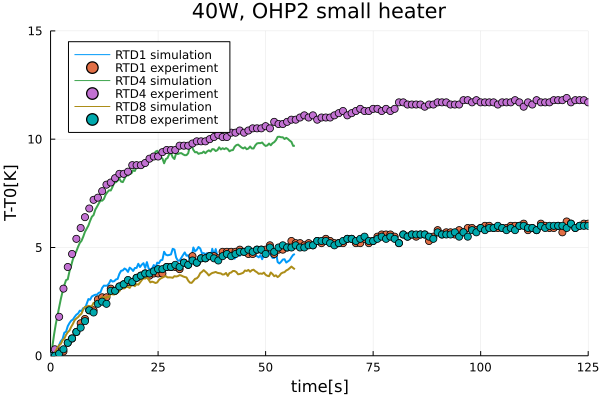

In [103]:
i = 1 #RTD number

plot(thist,ghist[i] .-Tᵥ,label=string("RTD", i," simulation"),linewidth=2)
# plot(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i] .-Tᵥ,label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], label=string("RTD", i," experiment"),xlim=(0.0,50.0))

i = 4 #RTD number

plot!(thist,ghist[i] .-Tᵥ,label=string("RTD", i," simulation"),linewidth=2)
# plot(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i] .-Tᵥ,label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], label=string("RTD", i," experiment"),xlim=(0.0,50.0))

i = 8 #RTD number
plot!(thist,ghist[i] .-Tᵥ,label=string("RTD", i," simulation"),linewidth=2,legend=:topleft,title= "40W, OHP2 small heater",xlim=(0.0,125.0),xlabel="time[s]",ylabel="T-T0[K]",ylim=(0,60))
# plot!(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i] .-Tᵥ,label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i],legend=:topleft, label=string("RTD", i," experiment"),title= "40W, OHP2 small heater",xlim=(0.0,125.0),xlabel="time[s]",ylabel="T-T0[K]",ylim=(0,15))

┌ Info: Saved animation to 
│   fn = /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/src/tmp.gif
└ @ Plots /Users/yuxuanli/.julia/packages/Plots/Ra8fG/src/animation.jl:126


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/src/tmp.gif")
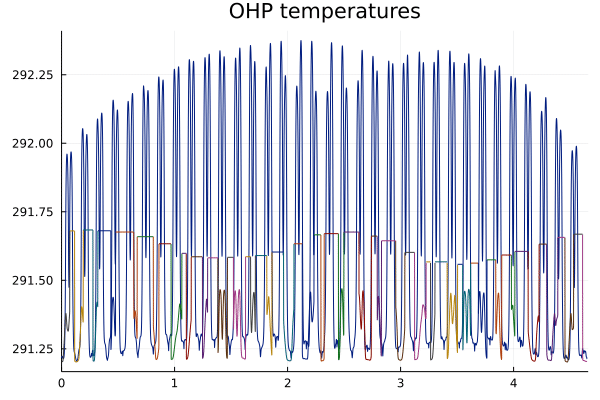

In [104]:
@gif for ii=1:length(sysfinal)
     plot(sysfinal[ii],plottype="T",xlim=(0.0,4.66))
end

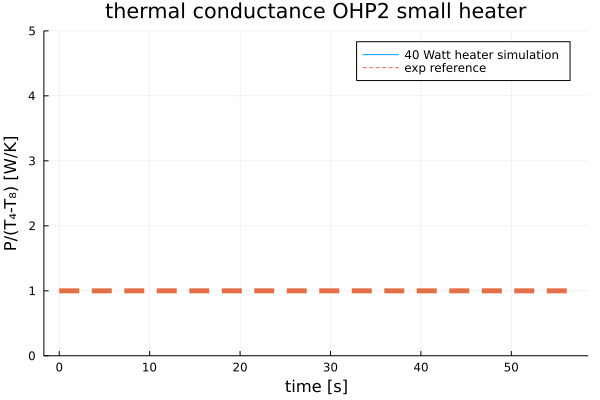

In [102]:
i1 = 4 #RTD number
i2 = 8 #RTD number
power = 40
conductance_40W_small = power ./ (ghist[i1] .-ghist[i2])

plot(thist, conductance_40W_small,label=string("40 Watt heater simulation"),linewidth=2,ylim=(0,5),title="thermal conductance OHP2 small heater",xlabel="time [s]",ylabel="P/(T₄-T₈) [W/K]")
plot!([0,thist[end]],[1.0,1.0],linewidth = 5,linestyle=:dash,label="exp reference")
# plot(thist, conductance_30W_big,label=string("30 Watt heater simulation"),linewidth=2,ylim=(0,20))
# plot(thist, conductance_20W_big,label=string("20 Watt heater simulation"),linewidth=2,ylim=(0,20))
# plot(thist, conductance_10W_big,label=string("10 Watt heater simulation"),linewidth=2,ylim=(0,20))

In [89]:
num_vapor_temp = zeros(size(sysfinal))
for i = 1:length(sysfinal)
num_vapor_temp[i] = size(sysfinal[i].vapor.δstart)[1]
end

mean(num_vapor_temp[10:end])

sysfinal[end].tube.L / mean(num_vapor_temp[10:end])

0.08640021554622018

## conductance curves OHP1

In [18]:
i1 = 4 #RTD number
i2 = 8 #RTD number

8

In [19]:
using Statistics

In [134]:
thist, ghist = load("OHP1_10W_e065_2_DT1_curve.jld2","thist","ghist");
power = 10
conductance_10W_big = power ./ (ghist[i1] .-ghist[i2])
mean_10W_big = mean(conductance_10W_big[76:101])
std_10W_big = std(conductance_10W_big[76:101])

0.12242600662599651

In [136]:
thist, ghist = load("OHP1_20W_e065_2_DT1_curve.jld2","thist","ghist");
power = 20
conductance_20W_big = power ./ (ghist[i1] .-ghist[i2])
mean_20W_big = mean(conductance_20W_big[76:101])
std_20W_big = std(conductance_20W_big[76:101])

0.1917869331941343

In [149]:
thist, ghist = load("OHP1_30W_e065_2_DT1_curve.jld2","thist","ghist");
power = 30
conductance_30W_big = power ./ (ghist[i1] .-ghist[i2])
mean_30W_big = mean(conductance_30W_big[76:101])
std_30W_big = std(conductance_30W_big[76:101])

0.17607571144099748

In [177]:
thist, ghist = load("OHP1_40W_e065_2_DT1_curve.jld2","thist","ghist");
power = 40
conductance_40W_big = power ./ (ghist[i1] .-ghist[i2])
mean_40W_big = mean(conductance_40W_big[76:101])
std_40W_big = std(conductance_40W_big[76:101])

0.2504704163255825

In [138]:
mean_10W_big

4.355668725581907

In [139]:
mean_20W_big

6.270578219063219

In [150]:
mean_30W_big

6.819315546346996

In [140]:
mean_40W_big

6.976423880832537

In [171]:
exp3 = [4.2 5.9 6.3 6.8]
exp2 = [3.8 5.0 6.5 6.9]
exp1 = [4.0 5.9 6.7 6.7]

num_result = [mean_10W_big,mean_20W_big,mean_30W_big,mean_40W_big]
σs = [std_10W_big,std_20W_big,std_30W_big,std_40W_big]

powerlist = [10 20 30 40]
powerlist_num = [10,20,30,40]

4-element Vector{Int64}:
 10
 20
 30
 40

In [172]:
num_result

4-element Vector{Float64}:
 4.355668725581907
 6.270578219063219
 6.819315546346996
 6.976423880832537

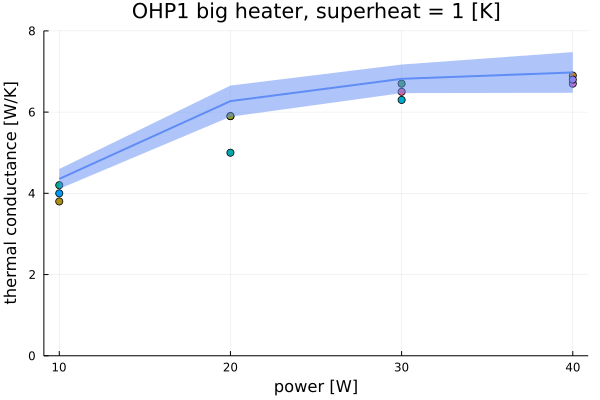

In [184]:
scatter(powerlist,exp1,legend=false)
scatter!(powerlist,exp2)
scatter!(powerlist,exp3)
plot!(powerlist_num,num_result,ribbon=2σs,linewidth=2.0,xlabel="power [W]", ylabel="thermal conductance [W/K]",title="OHP1 big heater, superheat = 1 [K]",ylim=(0,8))

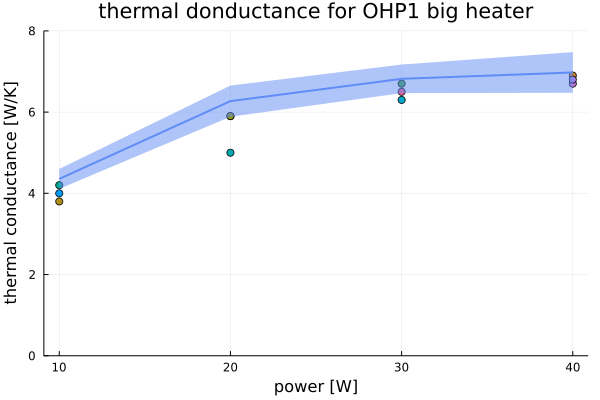

In [180]:
scatter(powerlist,exp1,legend=false)
scatter!(powerlist,exp2)
scatter!(powerlist,exp3)
plot!(powerlist_num,num_result,ribbon=2σs,linewidth=2.0,xlabel="power [W]", ylabel="thermal conductance [W/K]",title="thermal donductance for OHP1 big heater",ylim=(0,8))

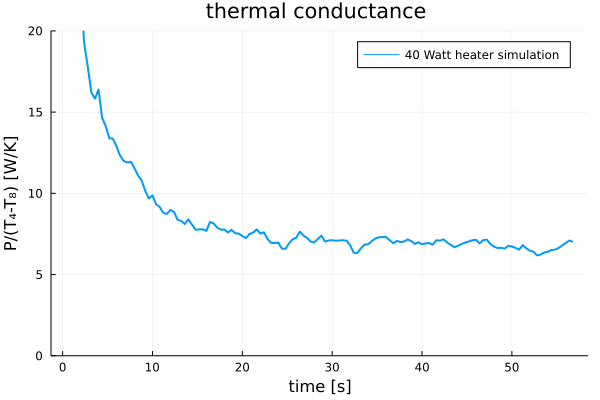

In [181]:
i1 = 4 #RTD number
i2 = 8 #RTD number
plot(thist, conductance_40W_big,label=string("40 Watt heater simulation"),linewidth=2,ylim=(0,20),title="thermal conductance ",xlabel="time [s]",ylabel="P/(T₄-T₈) [W/K]")
# plot(thist, conductance_30W_big,label=string("30 Watt heater simulation"),linewidth=2,ylim=(0,20))
# plot(thist, conductance_20W_big,label=string("20 Watt heater simulation"),linewidth=2,ylim=(0,20))
# plot(thist, conductance_10W_big,label=string("10 Watt heater simulation"),linewidth=2,ylim=(0,20))

In [26]:
# savefig("thermal_conductance.pdf")

## Plot temperature curves

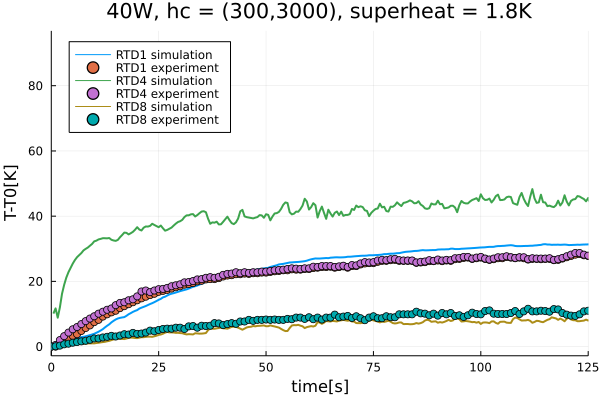

In [30]:
i = 1 #RTD number

plot(thist,ghist[i] .-Tᵥ,label=string("RTD", i," simulation"),linewidth=2)
# plot(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i] .-Tᵥ,label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], label=string("RTD", i," experiment"),xlim=(0.0,50.0))

i = 4 #RTD number

plot!(thist,ghist[i] .-Tᵥ,label=string("RTD", i," simulation"),linewidth=2)
# plot(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i] .-Tᵥ,label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], label=string("RTD", i," experiment"),xlim=(0.0,50.0))

i = 8 #RTD number
plot!(thist,ghist[i] .-Tᵥ,label=string("RTD", i," simulation"),linewidth=2)
# plot!(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i] .-Tᵥ,label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i],legend=:topleft, label=string("RTD", i," experiment"),title= "40W, hc = (300,3000), superheat = 1.8K",xlim=(0.0,125.0),xlabel="time[s]",ylabel="T-T0[K]")

In [ ]:
savefig("Tempcurves.svg")

## ~heat ressistance curves

In [ ]:
power = 40

In [ ]:
i1 = 4 #RTD number
i2 = 8 #RTD number
plot(thist, power ./ (ghist[i1] .-ghist[i2]),label=string("40 Watt heater simulation"),linewidth=2,ylim=(0,15))
# plot(thist_DT1_H3000_Film3_F1_Nu436_plated_2, power ./ (ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i1] .-ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i2]),label=string("40 Watt heater simulation"),linewidth=2,ylim=(0,15))
# plot(thist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2,ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i1] .-ghist_conserve_DT1_H3000_Film3_F1_Nu436_plated_2[i2],label=string("RTD", i," flim δ=30 μm, ΔT=1.0 [K], Hc = 3000 [W/K], plate d = 2 [mm]"),linewidth=2)
# plot!(thist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15,ghist_conserve_DT2_H4000_Film3_F1_Nu436_plated_15[i] .-Tᵥ,label=string("RTD", i," flim δ=30 μm, ΔT=2.0 [K], Hc = 4000 [W/K], plate d = 1.5 [mm]"),linewidth=2)
# plot!(thist_Conserve_H2250_D1_TH1,ghist_Conserve_H2250_D1_TH1[i1] .-ghist_Conserve_H2250_D1_TH1[i2],label=string("RTD", i," flim δ=10 μm, ΔT=1.0 [K], Hc = 2250 [W/K], plate d = 1.5 [mm]"),linewidth=2)
scatter!(RTDt .- RTDt[1],power ./(RTD[:,i1] .- RTD[:,i2]), label=string("40 Watt heater experiment"),legend=:topright,xlim=(0.0,400.0),title="thermal conductance ",xlabel="time [s]",ylabel="P/(T₄-T₁) [W/K]")

## film δ distribution

In [ ]:
addindex = 50:1:300
δArray = []
for i in addindex
δArray = [δArray;sysfinal[i].vapor.δ]
end

In [ ]:
histogram(δArray,bins=2.0e-5:0.25e-6:3.0e-5,title="sum of δ from 50[s] : 1[s] : 100[s]",legend=false,xlabel="δ [m]",ylabel="N of vapor") 

In [ ]:
savefig("sum_film_thickness.svg")

In [ ]:
sysfinal[end].vapor.δ

In [ ]:
l = @layout [a b ; c d]
pltindex=[5,25,100,300]
p1 = histogram(sysfinal[pltindex[1]].vapor.δ,bins=2.5e-5:0.25e-6:3.5e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[1]].t, digits=2), "[s]")) 
p2 = histogram(sysfinal[pltindex[2]].vapor.δ,bins=2.5e-5:0.25e-6:3.5e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[2]].t, digits=2), "[s]")) 
p3 = histogram(sysfinal[pltindex[3]].vapor.δ,bins=2.5e-5:0.25e-6:3.5e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[3]].t, digits=2), "[s]")) 
p4 = histogram(sysfinal[pltindex[4]].vapor.δ,bins=2.5e-5:0.25e-6:3.5e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[4]].t, digits=2), "[s]")) 
plot(p1, p2, p3, p4, layout = l,titlefontsize=10,labelfontsize=10,xticks=2.5e-5:0.5e-5:3.5e-5,legend=false,xlabel="δ [m]",ylabel="N of vapor",plot_title="film thickness histogram")

In [ ]:
savefig("film_histogram.pdf")

## dXdt distribution

In [105]:
V = [elem[2] for elem in sysfinal[end-5].liquid.dXdt]
Vavg = sum(abs.(V))/length(V)

0.5585985404661691

In [106]:
addindex = 50:1:100
VArray = []
for i in addindex
VArray = [VArray;[elem[2] for elem in sysfinal[i].liquid.dXdt]]
end

In [111]:
mean(abs.(VArray))

0.44301352866264954

In [107]:
density  = fitdensity(VArray,step=0.1,norm=1)

LoadError: UndefVarError: fitdensity not defined

In [108]:
plot(density.x,density.d)

LoadError: type #density has no field x

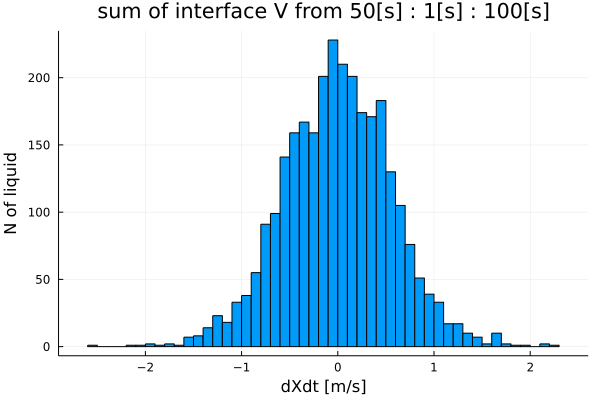

In [109]:
histogram(VArray,title="sum of interface V from 50[s] : 1[s] : 100[s]",legend=false,xlabel="dXdt [m/s]",ylabel="N of liquid") 

In [ ]:
savefig("sum_interface_V.svg")

In [ ]:
([elem[1] for elem in sysfinal[pltindex[1]].liquid.dXdt]-[elem[2] for elem in sysfinal[pltindex[1]].liquid.dXdt])./[elem[1] for elem in sysfinal[pltindex[1]].liquid.dXdt]

In [ ]:
l = @layout [a b ; c d]
pltindex=[5,25,100,300]
p1 = histogram([elem[1] for elem in sysfinal[pltindex[1]].liquid.dXdt],bins=-2:0.1:2,ylim=(0,20),title=string(round(tube_hist[pltindex[1]].t, digits=2), "[s]")) 
p2 = histogram([elem[1] for elem in sysfinal[pltindex[2]].liquid.dXdt],bins=-2:0.1:2,ylim=(0,20),title=string(round(tube_hist[pltindex[2]].t, digits=2), "[s]")) 
p3 = histogram([elem[1] for elem in sysfinal[pltindex[3]].liquid.dXdt],bins=-2:0.1:2,ylim=(0,20),title=string(round(tube_hist[pltindex[3]].t, digits=2), "[s]")) 
p4 = histogram([elem[1] for elem in sysfinal[pltindex[4]].liquid.dXdt],bins=-2:0.1:2,ylim=(0,20),title=string(round(tube_hist[pltindex[4]].t, digits=2), "[s]")) 
plot(p1, p2, p3, p4, layout = l,titlefontsize=10,labelfontsize=10,legend=false,xlabel="dXdt [m/s]",ylabel="N of liquid",plot_title="liquid slug velocity histogram")

In [ ]:
savefig("bulkV_histogram.pdf")

## correlated film δ

In [ ]:
l = @layout [a b ; c d]
pltindex=[5,15,25,590]
p1 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[1]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:3e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[1]].t, digits=2), "[s]")) 
p2 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[2]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:3e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[2]].t, digits=2), "[s]")) 
p3 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[3]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:3e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[3]].t, digits=2), "[s]")) 
p4 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[4]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:3e-5,ylim=(0,20),title=string("t=",round(tube_hist[pltindex[4]].t, digits=2), "[s]")) 
plot(p1, p2, p3, p4, layout = l,titlefontsize=10,labelfontsize=10,xticks=1e-5:2e-5:5e-5,legend=false,xlabel="δ [m]",ylabel="N of vapor",plot_title="film thickness histogram from Ca correlarion")

## OHP animation

In [ ]:
ρ = 2700;
c = 8.97e02;
k = 1.67e02;
d = 2e-3;
params = HeatConductionParameters(ρ,c,k,thickness=d)

In [ ]:
Δx = cellsize(sys)
ds = 1.5Δx
nturn = 16
#pitch = 0.125
length_ohp = 44.25*1e-3
height = 133.83*1e-3
gap = d
pitch = length_ohp/(2*nturn+1)
x0, y0 = height/2, length_ohp/2
x, y, xf, yf = ComputationalHeatTransfer.construct_ohp_curve(nturn,pitch,height,gap,ds,x0,y0,false,false,3pi/2)
ohp = BasicBody(x,y)

In [ ]:
sys.points

In [ ]:
@gif for i=1:1:length(sysfinal)
    Htmp = sys_to_Harray(sysfinal[i])
    plot(ohp,fillalpha=0,linecolor=cgrad([:gold, :blue],rev=true),line_z=Htmp,xlabel="x ",ylabel="y ",border=:none,axis=nothing,title=string("time = ", round(plate_hist[i].t, digits=2), "[s] \n",  "T[K]"))
end

## OHP film thickness correlation

In [ ]:
integrator_tube.p.vapor.δ

In [ ]:

velocity_avg = zeros(length(sysfinal))
velocity_max = zeros(length(sysfinal))

for i = 1:length(sysfinal)
    tmp = 0
    for j = length(sysfinal[i].liquid.dXdt)
        tmp += abs(sysfinal[i].liquid.dXdt[j][1])
    
        velocity_avg[i] = tmp/j
    end
    
    velocity_max[i] = maximum(abs.(sysfinal[i].liquid.dXdt[:][1]))
end



In [ ]:
μₗ

In [ ]:
Ca = velocity_max .* μₗ ./σ

In [ ]:
plot(thist,velocity_avg,label="v avg")
plot!(thist,velocity_max,label="v max",xlabel="t [s]", ylabel="v [m/s]")

In [ ]:
d_tube = sysfinal[end].tube.d

### Range of Re
### $Re = \frac{\rho_{\mathrm{l}} v d}{\mu_{\mathrm{l}}}$



In [ ]:
Re_avg = d_tube*ρₗ .* velocity_avg / μₗ
Re_max = d_tube*ρₗ .* velocity_max / μₗ;

In [ ]:
plot(thist,Re_avg,label="v avg")
plot!(thist,Re_max,label="v max",xlabel="t [s]", ylabel="Re")

In [ ]:
integrator_tube.p.vapor.δ

In [ ]:
δ_corr = integrator_tube.p.tube.d * (0.67 .* Ca.^(2/3)) ./ ( 1 .+ 3.35 .* Ca.^(2/3))

In [ ]:
δ_corr = integrator_tube.p.tube.d * (0.67 .* Ca2.^(2/3)) ./ ( 1 .+ 3.35 .* Ca2.^(2/3))

In [ ]:
U = 0.4 #m/s

Ca2 = U .* μₗ ./σ

In [ ]:
tube_d = 1e-3

In [ ]:
Ca_star1 = (μₗ^2/(σ * ρₗ * tube_d/2))^(3/4)

In [ ]:
Ca_star2 = (μₗ^2/(σ * ρₗ * tube_d/2))^(1/2)

In [ ]:
sysfinal[1].wall.ΔTthres

In [ ]:
sysfinal[1].vapor.δ

In [ ]:
l = @layout [a b ; c d]
pltindex=[5,15,25,100]
p1 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[1]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:5e-5,ylim=(0,20),title=string("t=",round(plate_hist[pltindex[1]].t, digits=2), "[s]")) 
p2 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[2]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:5e-5,ylim=(0,20),title=string("t=",round(plate_hist[pltindex[2]].t, digits=2), "[s]")) 
p3 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[3]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:5e-5,ylim=(0,20),title=string("t=",round(plate_hist[pltindex[3]].t, digits=2), "[s]")) 
p4 = histogram(filmδcorr(getCa(μₗ,σ,[elem[2] for elem in sysfinal[pltindex[4]].liquid.dXdt]),sysfinal[1].tube.d),bins=0e-5:2e-6:5e-5,ylim=(0,20),title=string("t=",round(plate_hist[pltindex[4]].t, digits=2), "[s]")) 
plot(p1, p2, p3, p4, layout = l,titlefontsize=10,labelfontsize=10,xticks=1e-5:2e-5:5e-5,legend=false,xlabel="δ [m]",ylabel="N of vapor",plot_title="film thickness histogram")

In [ ]:
i = 100
velocity = 
Ca = 

plot(δfilm)

In [ ]:
velocity = [elem[1] for i =1:]getCa(μ,σ,velocity)

In [ ]:
ρₗ-ρᵥ

In [ ]:
bo = (ρₗ-ρᵥ).*9.8*(1e-3)^2/σ

In [ ]:
μₗ.*1.0/σ

In [ ]:
function getCa(μ,σ,velocity)
    Ca = abs.(μ.*velocity./σ)
end

function filmδcorr(Ca,d)
    filmδ = d .* 0.67.*Ca.^(2/3)./(1 .+ 3.35.*Ca.^(2/3))
end

## Film thickness graphs

In [ ]:
@gif for i=length(sysfinal):length(sysfinal)
    plot(sysfinal[i].vapor.δ,xlabel="vapor label",ylabel="film thickness [m]", label = "δ",ylim=(5e-6,1.5e-5))
end

## boiling graph

In [ ]:
boil_data = load("OHP1_40W.jld2","boil_data");

In [ ]:
Xstations = sysfinal[end].wall.Xstations;

In [ ]:
tend = boil_data[end,2]
boil_dt = 0.1;

In [ ]:
using SparseArrays 

In [ ]:
boil_matrix=spzeros(size(Xstations,1),Int64(round(tend/boil_dt)));
for tnum = 1:size(boil_matrix,2)
     boil_index = findall(x->Int64(round(x/boil_dt))==tnum,boil_data[:,2])

    if length(boil_index) != 0
        i_station_temp = Int64.(boil_data[boil_index,1])
        for i in i_station_temp
            boil_matrix[i,tnum] = 1
        end
    end
end


In [ ]:
boil_num_t = sum(boil_matrix, dims=1)'
boil_num_x = sum(boil_matrix, dims=2);

In [ ]:
using EasyFit

m10 = movavg(vec(boil_num_t),10)


In [ ]:
m10.R

In [ ]:
plot(0.1:0.1:300.0,m10.x,xlabel="t",ylabel="N",title="number of active boiling sites (moving averaged)",legend=false)

In [ ]:
savefig("boiling frequency.pdf")

In [ ]:
boiling

In [ ]:
num_boiling = zeros(size(Xstations))
for i = 1:size(boil_data,1)
    num_boiling[Int64(sorted_boil_hist[i,1])] += 1
end
freq_boiling = num_boiling/tend;

In [ ]:
sorted_boil_hist = boil_data[sortperm(boil_data[:, 1]), :]
num_boiling = zeros(size(Xstations))
for i = 1:size(sorted_boil_hist,1)
    num_boiling[Int64(sorted_boil_hist[i,1])] += 1
end
freq_boiling = num_boiling/tend;

In [ ]:
scatter(xstations,freq_boiling,xlabel="x[m]",ylabel="boiling frequency [HZ]",legend=false)

In [ ]:
scatter(ystations,freq_boiling,xlabel="y[m]",ylabel="boiling frequency [HZ]",legend=false)

In [ ]:
ohp = load("ohp.jld2","ohp")

In [ ]:
Lx = 0.1524; # plate size x
Ly = 0.0648; # plate size y

xlim = (-Lx/2,Lx/2) .*1.0
ylim = (-Ly/2,Ly/2) .*1.0
# Δx, Δt = setstepsizes(params.α,gridPe=8.0,fourier=0.3)


In [ ]:
plot(ohp,fillalpha=0,linecolor=:blue,xlims=xlim,ylims=ylim,framestyle = :box)
scatter!(xstations,ystations)

In [ ]:
savefig("boiling sites.svg")

In [ ]:
ql = sys.qline[1]
interp_linear_x = LinearInterpolation(ql.arccoord, ql.body.x,extrapolation_bc = Line());
interp_linear_y = LinearInterpolation(ql.arccoord, ql.body.y,extrapolation_bc = Line());

xstations = interp_linear_x[sysfinal[end].wall.Xstations]
ystations = interp_linear_y[sysfinal[end].wall.Xstations]

In [ ]:
Lliquid = XptoLliquidslug(sysfinal[end].liquid.Xp,sysfinal[end].tube.L)

sum(Lliquid)/sysfinal[end].tube.L

In [ ]:
Lx = 0.1524; # plate size x
Ly = 0.0648; # plate size y

In [ ]:
plate_d = 2e-3
tube_d = 1e-3

In [ ]:
(Lx*Ly*plate_d - sysfinal[1].tube.L * tube_d^2)/(Lx*Ly)

In [48]:
sum(sysfinal[end].vapor.Lfilm_start .* sysfinal[end].vapor.δstart + sysfinal[end].vapor.Lfilm_end .* sysfinal[end].vapor.δend) / sum(sysfinal[end].vapor.Lfilm_start + sysfinal[end].vapor.Lfilm_end) 

2.375779426615981e-5